In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
ROOT_DIR = '/content/drive/MyDrive/YOLO8'

In [3]:
%cd {ROOT_DIR}

/content/drive/MyDrive/YOLO8


In [4]:
!git clone https://github.com/ultralytics/ultralytics.git

fatal: destination path 'ultralytics' already exists and is not an empty directory.


In [5]:

%ls

input/  runs/  ultralytics/  yolov8n.pt


In [6]:
%cd ultralytics

/content/drive/MyDrive/YOLO8/ultralytics


In [7]:
!pip install -r requirements.txt


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.5/565.5 kB 34.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.1/203.1 kB 27.0 MB/s eta 0:00:00


In [9]:
%cd {ROOT_DIR}

/content/drive/MyDrive/YOLO8


In [10]:

!pip install Ipython

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.7 MB/s eta 0:00:00


In [11]:
import matplotlib.pyplot as plt
from IPython.display import Image as imgshow
import os

# object detection

In [12]:
%cd /content/drive/MyDrive/YOLO8

/content/drive/MyDrive/YOLO8


In [ ]:

!yolo task=detect mode=predict model=yolov8n.pt conf=0.7 source="/content/drive/MyDrive/YOLO8/input/dogs_n_cars (1).jpg" save=True

Ultralytics YOLOv8.0.92 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/drive/MyDrive/YOLO8/input/dogs_n_cars (1).jpg: 640x640 4 persons, 7 cars, 4 dogs, 1 cow, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


# show image in command line 

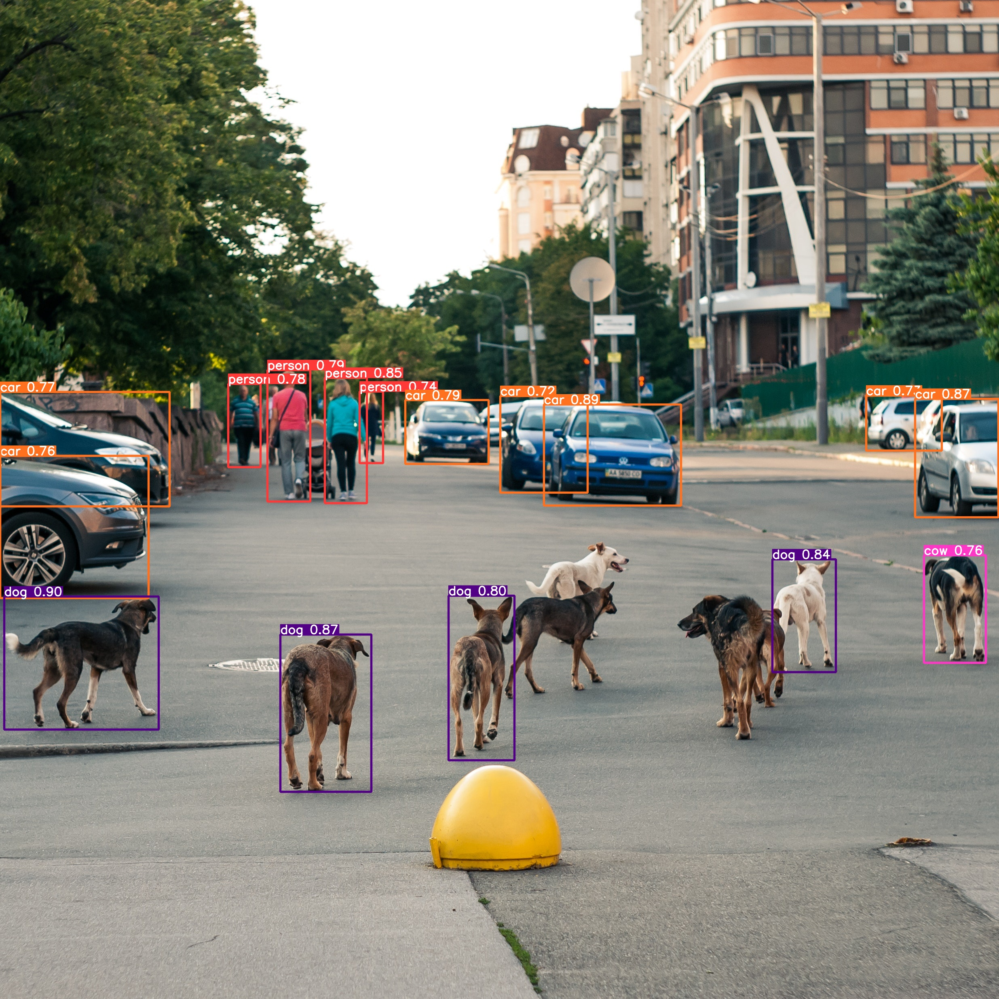

In [16]:
imgshow(os.path.join(ROOT_DIR,"/content/drive/MyDrive/YOLO8/runs/detect/predict/dogs_n_cars (1).jpg"), width = 600)

In [19]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source="/content/drive/MyDrive/YOLO8/input/test_vid (1).mp4" save=True

Ultralytics YOLOv8.0.93 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

video 1/1 (1/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 60.3ms
video 1/1 (2/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 9.1ms
video 1/1 (3/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 8.5ms
video 1/1 (4/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 9 persons, 7.8ms
video 1/1 (5/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 1 backpack, 7.5ms
video 1/1 (6/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 1 backpack, 8.1ms
video 1/1 (7/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 1 backpack, 7.7ms
video 1/1 (8/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 1 backpack, 7.5ms
video 1/1 (9/2

# show image in python code

In [28]:
from ultralytics import YOLO
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt


In [22]:

model = YOLO("yolov8n.pt")

In [24]:

image = Image.open('/content/drive/MyDrive/YOLO8/input/dogs_n_cars (1).jpg')
image = np.asarray(image)
results = model.predict(image)


0: 640x640 4 persons, 9 cars, 8 dogs, 1 cow, 7.8ms
Speed: 5.0ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


In [31]:


def box_label(image, box, label='', color=(128, 128, 128), txt_color=(255, 255, 255)):
  lw = max(round(sum(image.shape) / 2 * 0.003), 2)
  p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
  cv2.rectangle(image, p1, p2, color, thickness=lw, lineType=cv2.LINE_AA)
  if label:
    tf = max(lw - 1, 1)  # font thickness
    w, h = cv2.getTextSize(label, 0, fontScale=lw / 3, thickness=tf)[0]  # text width, height
    outside = p1[1] - h >= 3
    p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
    cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
    cv2.putText(image,
                label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                lw / 3,
                txt_color,
                thickness=tf,
                lineType=cv2.LINE_AA)

In [33]:

def plot_bboxes(image, boxes, labels=[], colors=[], score=True, conf=None):
  #Define COCO Labels
  if labels == []:
    labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}
  #Define colors
  if colors == []:
    #colors = [(6, 112, 83), (253, 246, 160), (40, 132, 70), (205, 97, 162), (149, 196, 30), (106, 19, 161), (127, 175, 225), (115, 133, 176), (83, 156, 8), (182, 29, 77), (180, 11, 251), (31, 12, 123), (23, 6, 115), (167, 34, 31), (176, 216, 69), (110, 229, 222), (72, 183, 159), (90, 168, 209), (195, 4, 209), (135, 236, 21), (62, 209, 199), (87, 1, 70), (75, 40, 168), (121, 90, 126), (11, 86, 86), (40, 218, 53), (234, 76, 20), (129, 174, 192), (13, 18, 254), (45, 183, 149), (77, 234, 120), (182, 83, 207), (172, 138, 252), (201, 7, 159), (147, 240, 17), (134, 19, 233), (202, 61, 206), (177, 253, 26), (10, 139, 17), (130, 148, 106), (174, 197, 128), (106, 59, 168), (124, 180, 83), (78, 169, 4), (26, 79, 176), (185, 149, 150), (165, 253, 206), (220, 87, 0), (72, 22, 226), (64, 174, 4), (245, 131, 96), (35, 217, 142), (89, 86, 32), (80, 56, 196), (222, 136, 159), (145, 6, 219), (143, 132, 162), (175, 97, 221), (72, 3, 79), (196, 184, 237), (18, 210, 116), (8, 185, 81), (99, 181, 254), (9, 127, 123), (140, 94, 215), (39, 229, 121), (230, 51, 96), (84, 225, 33), (218, 202, 139), (129, 223, 182), (167, 46, 157), (15, 252, 5), (128, 103, 203), (197, 223, 199), (19, 238, 181), (64, 142, 167), (12, 203, 242), (69, 21, 41), (177, 184, 2), (35, 97, 56), (241, 22, 161)]
    colors = [(89, 161, 197),(67, 161, 255),(19, 222, 24),(186, 55, 2),(167, 146, 11),(190, 76, 98),(130, 172, 179),(115, 209, 128),(204, 79, 135),(136, 126, 185),(209, 213, 45),(44, 52, 10),(101, 158, 121),(179, 124, 12),(25, 33, 189),(45, 115, 11),(73, 197, 184),(62, 225, 221),(32, 46, 52),(20, 165, 16),(54, 15, 57),(12, 150, 9),(10, 46, 99),(94, 89, 46),(48, 37, 106),(42, 10, 96),(7, 164, 128),(98, 213, 120),(40, 5, 219),(54, 25, 150),(251, 74, 172),(0, 236, 196),(21, 104, 190),(226, 74, 232),(120, 67, 25),(191, 106, 197),(8, 15, 134),(21, 2, 1),(142, 63, 109),(133, 148, 146),(187, 77, 253),(155, 22, 122),(218, 130, 77),(164, 102, 79),(43, 152, 125),(185, 124, 151),(95, 159, 238),(128, 89, 85),(228, 6, 60),(6, 41, 210),(11, 1, 133),(30, 96, 58),(230, 136, 109),(126, 45, 174),(164, 63, 165),(32, 111, 29),(232, 40, 70),(55, 31, 198),(148, 211, 129),(10, 186, 211),(181, 201, 94),(55, 35, 92),(129, 140, 233),(70, 250, 116),(61, 209, 152),(216, 21, 138),(100, 0, 176),(3, 42, 70),(151, 13, 44),(216, 102, 88),(125, 216, 93),(171, 236, 47),(253, 127, 103),(205, 137, 244),(193, 137, 224),(36, 152, 214),(17, 50, 238),(154, 165, 67),(114, 129, 60),(119, 24, 48),(73, 8, 110)]
  
  #plot each boxes
  for box in boxes:
    #add score in label if score=True
    if score :
      label = labels[int(box[-1])+1] + " " + str(round(100 * float(box[-2]),1)) + "%"
    else :
      label = labels[int(box[-1])+1]
    #filter every box under conf threshold if conf threshold setted
    if conf :
      if box[-2] > conf:
        color = colors[int(box[-1])]
        box_label(image, box, label, color)
    else:
      color = colors[int(box[-1])]
      box_label(image, box, label, color)

  #show image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  try:
    import google.colab
    IN_COLAB = True
  except:
    IN_COLAB = False

  if IN_COLAB:
    cv2_imshow(image) #if used in Colab
  else :
     
    cv2.imshow(image) #if used in Python

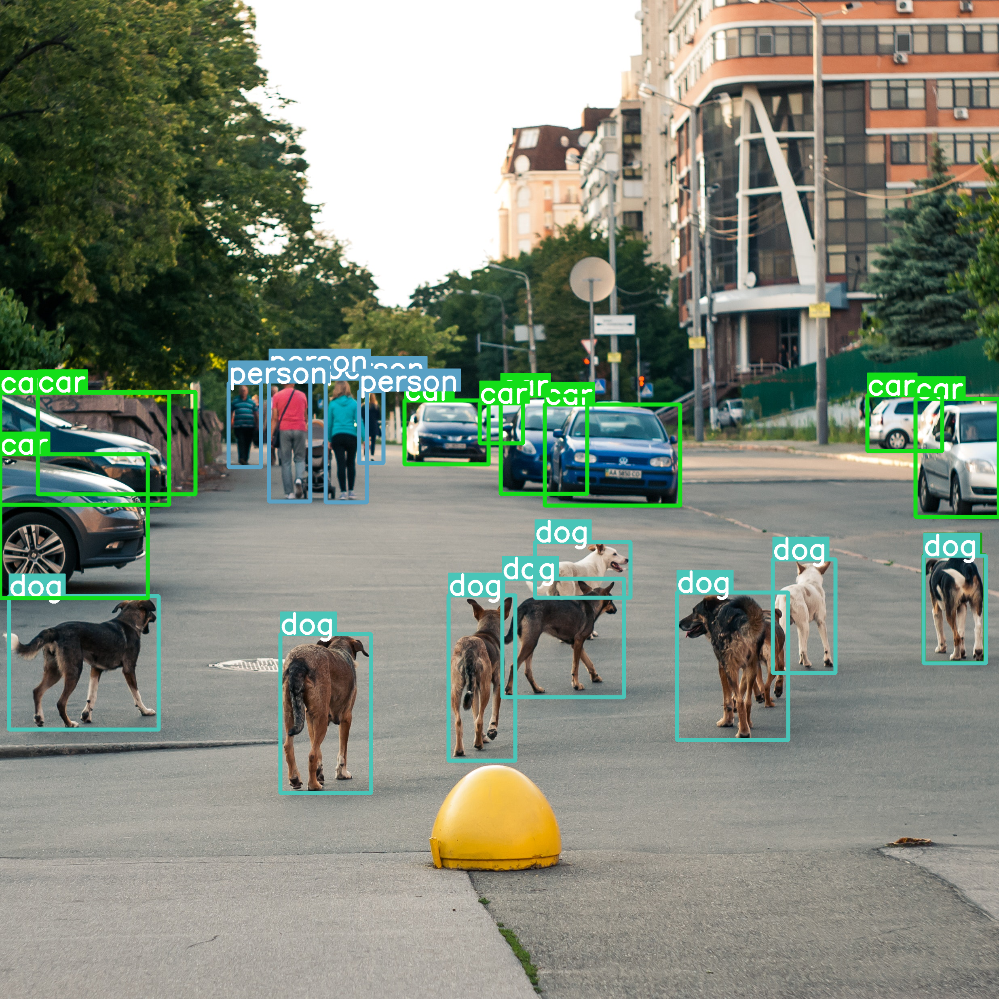

In [36]:

plot_bboxes(image, results[0].boxes.data, score=False)

# segmentation

In [37]:
!yolo task=segment mode=predict model='yolov8n-seg.pt' conf=0.25 source="/content/drive/MyDrive/YOLO8/input/dogs_n_cars (1).jpg" save=True

100% 6.73M/6.73M [00:00<00:00, 14.8MB/s]
Ultralytics YOLOv8.0.93 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3404320 parameters, 0 gradients, 12.6 GFLOPs

image 1/1 /content/drive/MyDrive/YOLO8/input/dogs_n_cars (1).jpg: 640x640 4 persons, 9 cars, 7 dogs, 1 cow, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 81.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


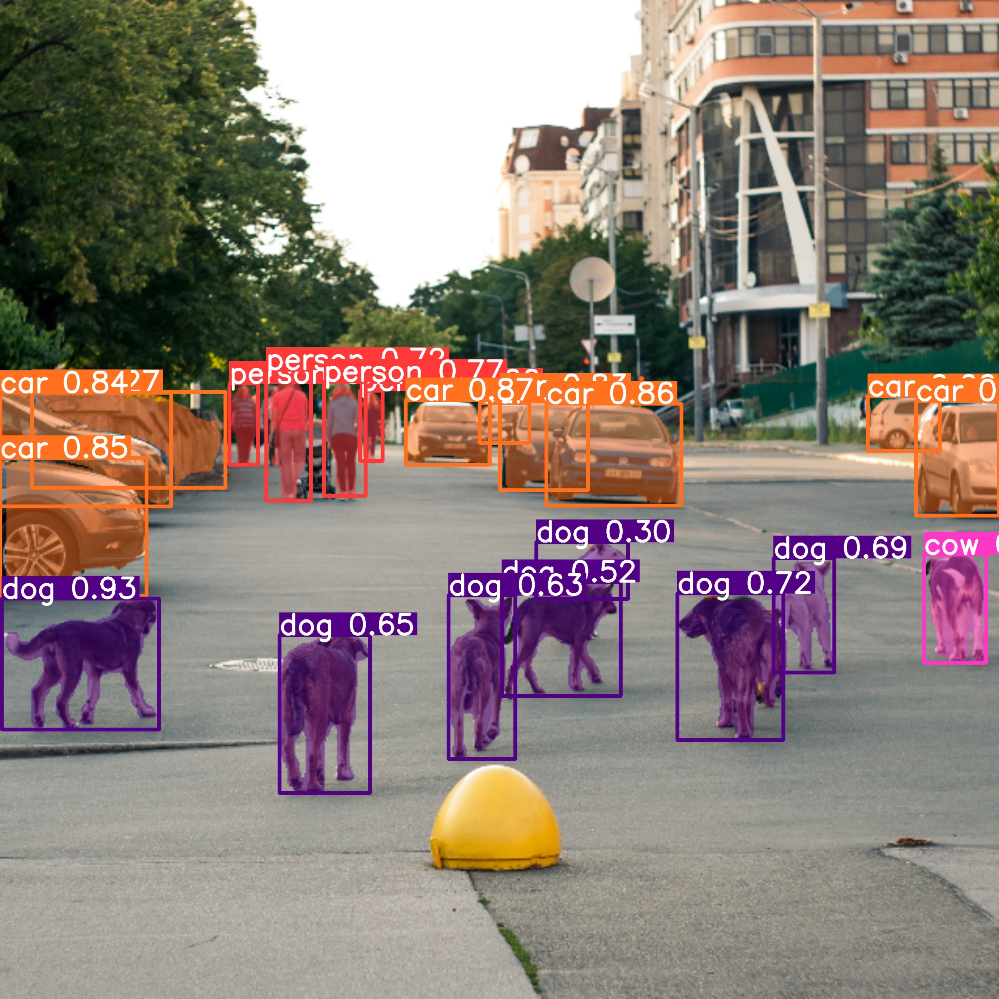

In [38]:

imgshow(os.path.join(ROOT_DIR,'/content/drive/MyDrive/YOLO8/runs/segment/predict/dogs_n_cars (1).jpg'), width = 600)

In [39]:
!yolo task=segment mode=predict conf=0.25 source="/content/drive/MyDrive/YOLO8/input/test_vid (1).mp4" save=True

Ultralytics YOLOv8.0.93 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3404320 parameters, 0 gradients, 12.6 GFLOPs

video 1/1 (1/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 9 persons, 116.3ms
video 1/1 (2/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 9 persons, 9.3ms
video 1/1 (3/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 11 persons, 9.4ms
video 1/1 (4/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 10 persons, 20.5ms
video 1/1 (5/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 11 persons, 10.1ms
video 1/1 (6/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 9 persons, 11.4ms
video 1/1 (7/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 9 persons, 18.1ms
video 1/1 (8/272) /content/drive/MyDrive/YOLO8/input/test_vid (1).mp4: 384x640 8 persons, 8.6ms
video 1/1 (9/272) /content/drive/MyDrive/YOLO8/in